Data Preprocessing

In [ ]:
from pathlib import Path
from PIL import Image
from collections import Counter

IMAGE_DIR = Path("./data/images")

# Supported image formats
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".webp"}

image_files = [
    path for path in IMAGE_DIR.rglob("*")
    if path.is_file() and path.suffix.lower() in IMAGE_EXTENSIONS
]


print(f"Total images: {len(image_files)}")

Total images: 831


In [2]:
dimensions = []

for image_path in image_files:
    try:
        with Image.open(image_path) as img:
            dimensions.append(img.size)
    except Exception as e:
        print(f"Could not open: {image_path}")
        print(e)

print(f"Successfully opened: {len(dimensions)}")
print(f"Unique dimensions: {len(set(dimensions))}")

dimension_counts = Counter(dimensions)

for dimension, count in dimension_counts.most_common(20):
    print(f"{dimension}: {count}")

Successfully opened: 831
Unique dimensions: 402
(342, 342): 38
(300, 300): 29
(299, 300): 11
(298, 300): 9
(232, 300): 8
(256, 300): 6
(285, 300): 6
(225, 300): 6
(228, 300): 6
(259, 300): 6
(291, 300): 6
(280, 300): 6
(268, 300): 6
(342, 421): 6
(292, 300): 5
(249, 300): 5
(174, 300): 5
(189, 300): 5
(255, 300): 5
(235, 300): 5


In [3]:
broken_images = []

for image_path in image_files:
    try:
        with Image.open(image_path) as img:
            img.verify()
    except Exception:
        broken_images.append(image_path)

print(f"Broken images: {len(broken_images)}")

Broken images: 0


In [4]:
for image_path in image_files[:20]:
    print(image_path)

data\images\keyword_01_product_001.jpg
data\images\keyword_01_product_002.jpg
data\images\keyword_01_product_003.jpg
data\images\keyword_01_product_004.jpg
data\images\keyword_01_product_005.jpg
data\images\keyword_01_product_006.jpg
data\images\keyword_01_product_007.jpg
data\images\keyword_01_product_008.jpg
data\images\keyword_01_product_009.jpg
data\images\keyword_01_product_010.jpg
data\images\keyword_01_product_011.jpg
data\images\keyword_01_product_012.jpg
data\images\keyword_01_product_013.jpg
data\images\keyword_01_product_014.jpg
data\images\keyword_01_product_015.jpg
data\images\keyword_01_product_016.jpg
data\images\keyword_02_product_001.jpg
data\images\keyword_02_product_002.jpg
data\images\keyword_02_product_003.jpg
data\images\keyword_02_product_004.jpg


In [5]:
from pathlib import Path
import pandas as pd
import re

IMAGE_DIR = Path("data/images")

image_files = [
    path for path in IMAGE_DIR.iterdir()
    if path.is_file() and path.suffix.lower() in {".jpg", ".jpeg", ".png", ".webp"}
]

records = []

pattern = re.compile(
    r"^(?P<keyword>.+?)_(?P<product>product_\d+)\.(?P<extension>jpg|jpeg|png|webp)$",
    re.IGNORECASE
)

for image_path in image_files:

    match = pattern.match(image_path.name)

    if match:
        records.append({
            "image_path": str(image_path),
            "filename": image_path.name,
            "keyword": match.group("keyword"),
            "product_id": match.group("product")
        })

image_df = pd.DataFrame(records)

print(image_df.head())
print()
print(f"Total images: {len(image_df)}")
print(f"Unique keywords: {image_df['keyword'].nunique()}")
print(f"Unique products: {image_df['product_id'].nunique()}")

                               image_path                    filename  \
0  data\images\keyword_01_product_001.jpg  keyword_01_product_001.jpg   
1  data\images\keyword_01_product_002.jpg  keyword_01_product_002.jpg   
2  data\images\keyword_01_product_003.jpg  keyword_01_product_003.jpg   
3  data\images\keyword_01_product_004.jpg  keyword_01_product_004.jpg   
4  data\images\keyword_01_product_005.jpg  keyword_01_product_005.jpg   

      keyword   product_id  
0  keyword_01  product_001  
1  keyword_01  product_002  
2  keyword_01  product_003  
3  keyword_01  product_004  
4  keyword_01  product_005  

Total images: 831
Unique keywords: 28
Unique products: 48


EDA


In [7]:
images_per_product = (
    image_df
    .groupby(["keyword", "product_id"])
    .size()
)

print(images_per_product.value_counts().sort_index())

1    831
Name: count, dtype: int64


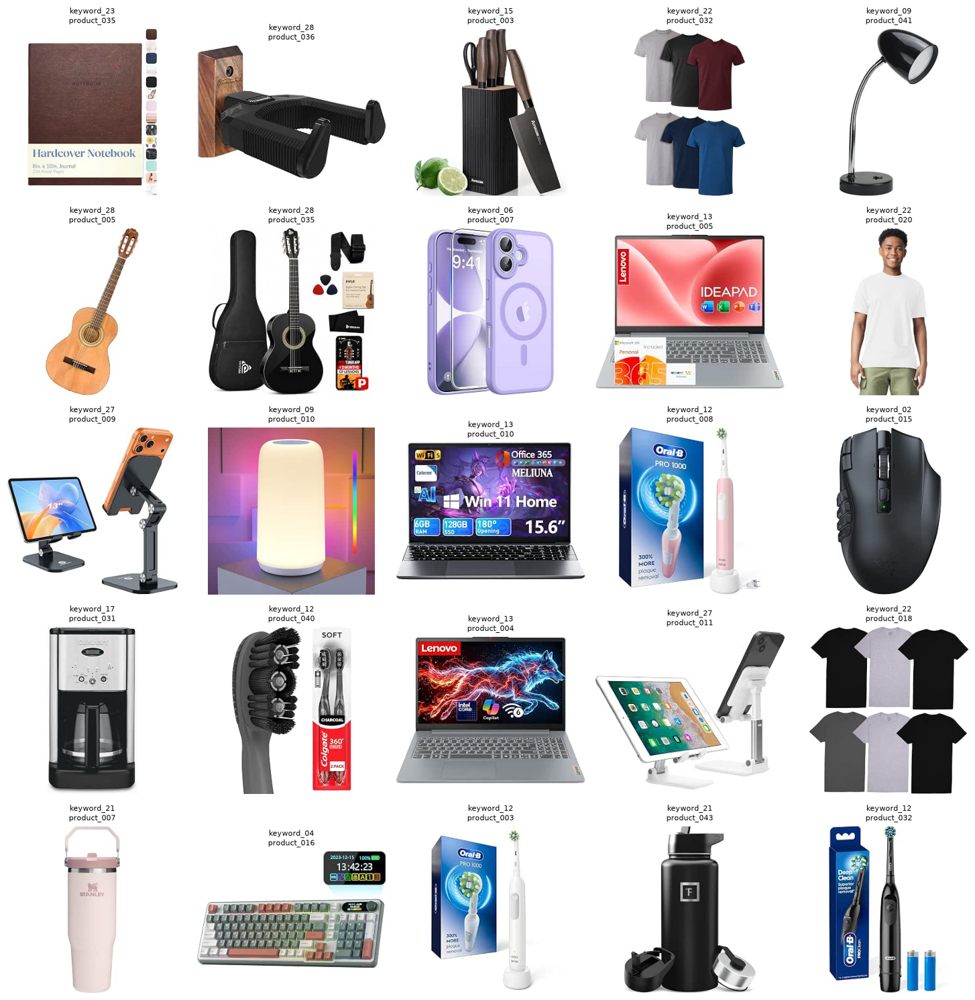

In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import math

sample = image_df.sample(25, random_state=42)

cols = 5
rows = 5

plt.figure(figsize=(15, 15))

for i, (_, row) in enumerate(sample.iterrows()):

    image = Image.open(row["image_path"])

    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(image)
    ax.set_title(
        f"{row['keyword']}\n{row['product_id']}",
        fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

Embedding Generation


In [9]:
import torch
from transformers import CLIPProcessor, CLIPModel

model_name = "openai/clip-vit-base-patch32"

processor = CLIPProcessor.from_pretrained(model_name)
model = CLIPModel.from_pretrained(model_name)

model.eval()

d:\Amazon Scrapper\AmazonScrapper\venv3.13\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
d:\Amazon Scrapper\AmazonScrapper\venv3.13\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\bjit\.cache\huggingface\hub\models--openai--clip-vit-base-patch32. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In or

CLIPModel(
  (text_model): CLIPTextModel(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True, bias=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1

In [11]:
from PIL import Image
import torch

image_path = image_df.iloc[0]["image_path"]

image = Image.open(image_path).convert("RGB")

inputs = processor(
    images=image,
    return_tensors="pt"
)

with torch.no_grad():
    vision_outputs = model.vision_model(**inputs)

    pooled_output = vision_outputs.pooler_output

    image_features = model.visual_projection(pooled_output)

print(image_features.shape)

torch.Size([1, 512])


In [15]:
import torch
import numpy as np
from PIL import Image
from tqdm import tqdm

all_embeddings = []

for image_path in tqdm(image_df["image_path"]):

    image = Image.open(image_path).convert("RGB")

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    with torch.no_grad():
        vision_outputs = model.vision_model(**inputs)
        pooled_output = vision_outputs.pooler_output
        image_features = model.visual_projection(pooled_output)

    all_embeddings.append(image_features.squeeze(0).cpu().numpy())

all_embeddings = np.array(all_embeddings)

print("Embedding shape:", all_embeddings.shape)

100%|██████████| 831/831 [03:22<00:00,  4.10it/s]

Embedding shape: (831, 512)


Normalizing The Embeddings

In [16]:
from sklearn.preprocessing import normalize

normalized_embeddings = normalize(all_embeddings)

print(normalized_embeddings.shape)

(831, 512)


PCA

In [23]:
from sklearn.decomposition import PCA

pca = PCA(n_components=130, random_state=42)

reduced_embeddings = pca.fit_transform(normalized_embeddings)

print("Original shape:", normalized_embeddings.shape)
print("Reduced shape:", reduced_embeddings.shape)
print("Explained variance:", pca.explained_variance_ratio_.sum())

Original shape: (831, 512)
Reduced shape: (831, 130)
Explained variance: 0.9017867


In [24]:
print(reduced_embeddings.shape)
print(pca.explained_variance_ratio_.sum())

(831, 130)
0.9017867


In [20]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca_2d = PCA(n_components=2, random_state=42)

embeddings_2d = pca_2d.fit_transform(reduced_embeddings)

print(embeddings_2d.shape)

(831, 2)


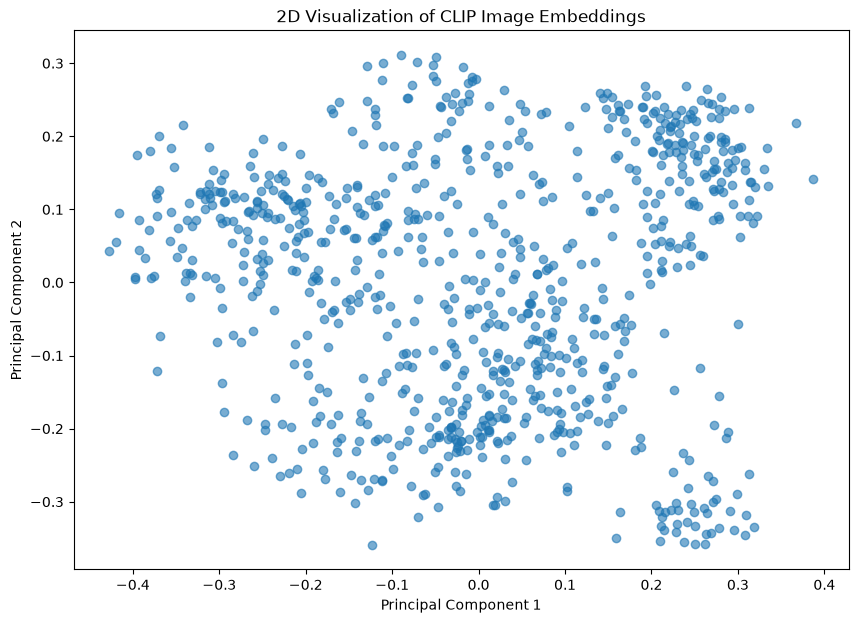

In [21]:
plt.figure(figsize=(10, 7))

plt.scatter(
    embeddings_2d[:, 0],
    embeddings_2d[:, 1],
    alpha=0.6
)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D Visualization of CLIP Image Embeddings")

plt.show()

Clustering


In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

results = []

for k in range(8, 50):

    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )

    labels = kmeans.fit_predict(reduced_embeddings)

    inertia = kmeans.inertia_

    silhouette = silhouette_score(
        reduced_embeddings,
        labels
    )

    results.append({
        "k": k,
        "inertia": inertia,
        "silhouette": silhouette
    })

results_df = pd.DataFrame(results)

print(results_df)

     k     inertia  silhouette
0    8  224.445007    0.142179
1    9  216.679749    0.143876
2   10  208.885025    0.149823
3   11  203.493256    0.153513
4   12  193.929382    0.167944
5   13  187.195282    0.182619
6   14  183.993225    0.184791
7   15  180.072037    0.187091
8   16  172.762756    0.197972
9   17  170.000763    0.202161
10  18  166.845245    0.204637
11  19  162.510651    0.205541
12  20  161.222031    0.203228
13  21  157.078735    0.214781
14  22  156.660461    0.208750
15  23  153.683685    0.202794
16  24  152.476685    0.204849
17  25  148.083496    0.216763
18  26  146.642273    0.215566
19  27  144.229401    0.223363
20  28  144.201523    0.208737
21  29  143.286484    0.203983
22  30  141.318970    0.192673
23  31  138.666565    0.208681
24  32  138.120544    0.217793
25  33  135.859116    0.220682
26  34  136.462891    0.200789
27  35  133.412918    0.200807
28  36  132.037628    0.212277
29  37  131.907547    0.201468
30  38  131.262772    0.205200
31  39  

Elbow Method

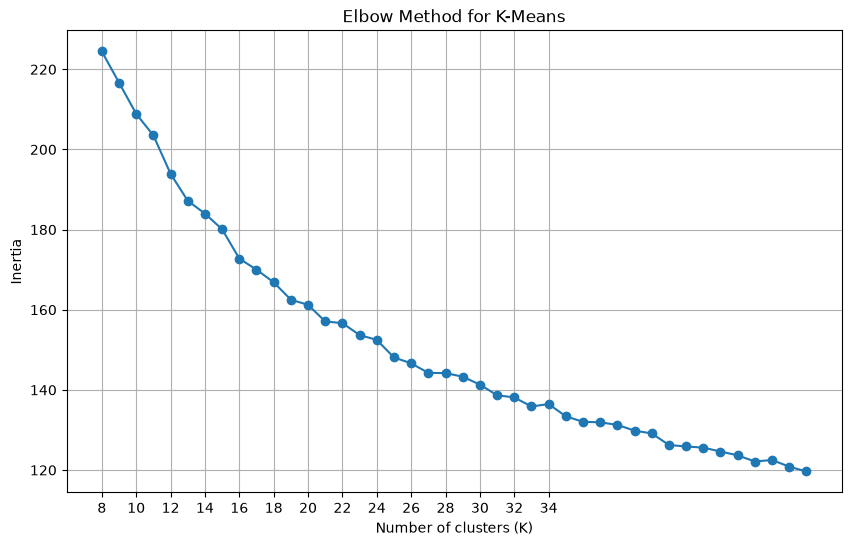

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(
    results_df["k"],
    results_df["inertia"],
    marker="o"
)

plt.xlabel("Number of clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method for K-Means")
plt.xticks(range(8, 35, 2))
plt.grid(True)

plt.show()

CLUSTERING

In [48]:
kmeans_33 = KMeans(
    n_clusters=33,
    random_state=42,
    n_init=10
)

labels_33 = kmeans_33.fit_predict(reduced_embeddings)

image_df["cluster"] = labels_33

print(image_df["cluster"].value_counts().sort_index())

cluster
0     18
1     38
2     33
3     21
4     42
5     46
6     16
7     34
8     19
9     48
10    47
11    49
12    37
13     4
14    48
15    27
16     4
17    17
18    16
19    45
20    15
21    16
22    16
23    25
24    14
25    20
26    16
27    18
28    19
29    26
30    16
31    16
32     5
Name: count, dtype: int64


VISUALIZATION OF THE CLUSTERS

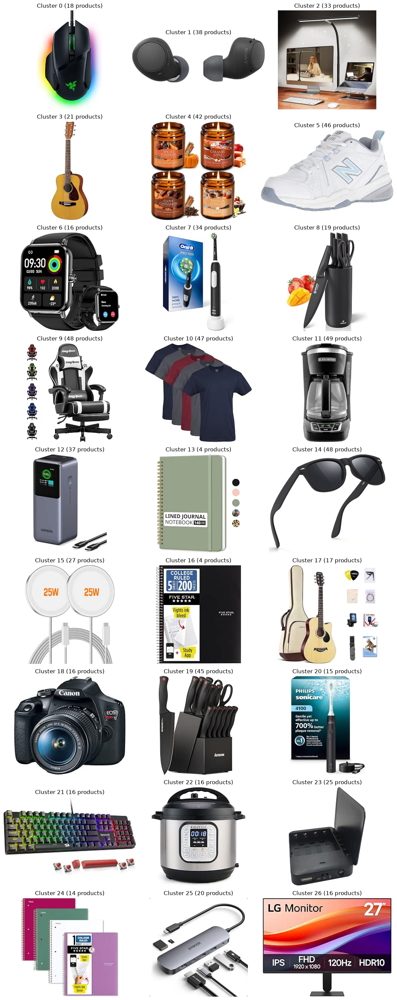

In [49]:
import matplotlib.pyplot as plt
from PIL import Image

fig, axes = plt.subplots(9, 3, figsize=(12, 30))

for cluster_id, ax in enumerate(axes.flat):

    cluster_images = image_df[
        image_df["cluster"] == cluster_id
    ]

    # Take one representative image
    image_path = cluster_images.iloc[0]["image_path"]

    image = Image.open(image_path).convert("RGB")

    ax.imshow(image)
    ax.set_title(
        f"Cluster {cluster_id} ({len(cluster_images)} products)"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

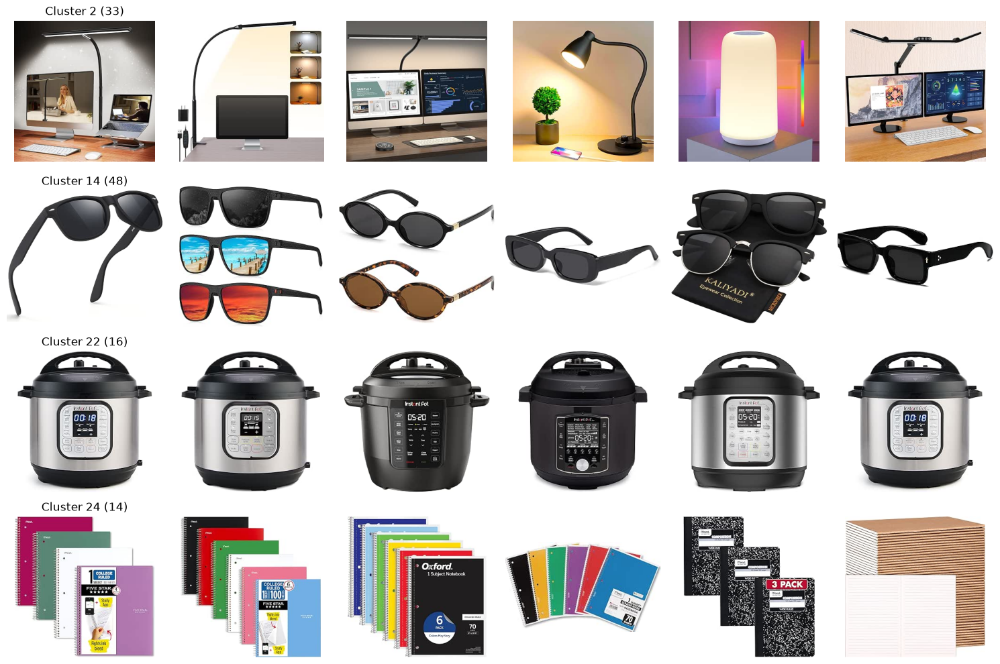

In [50]:
import matplotlib.pyplot as plt
from PIL import Image

clusters_to_check = [2, 14, 22, 24]

fig, axes = plt.subplots(
    4, 6,
    figsize=(15, 10)
)

for row, cluster_id in enumerate(clusters_to_check):

    cluster_images = image_df[
        image_df["cluster"] == cluster_id
    ].head(6)

    for col, (_, item) in enumerate(cluster_images.iterrows()):

        image = Image.open(
            item["image_path"]
        ).convert("RGB")

        axes[row, col].imshow(image)
        axes[row, col].axis("off")

        if col == 0:
            axes[row, col].set_title(
                f"Cluster {cluster_id} ({len(image_df[image_df['cluster'] == cluster_id])})"
            )

plt.tight_layout()
plt.show()

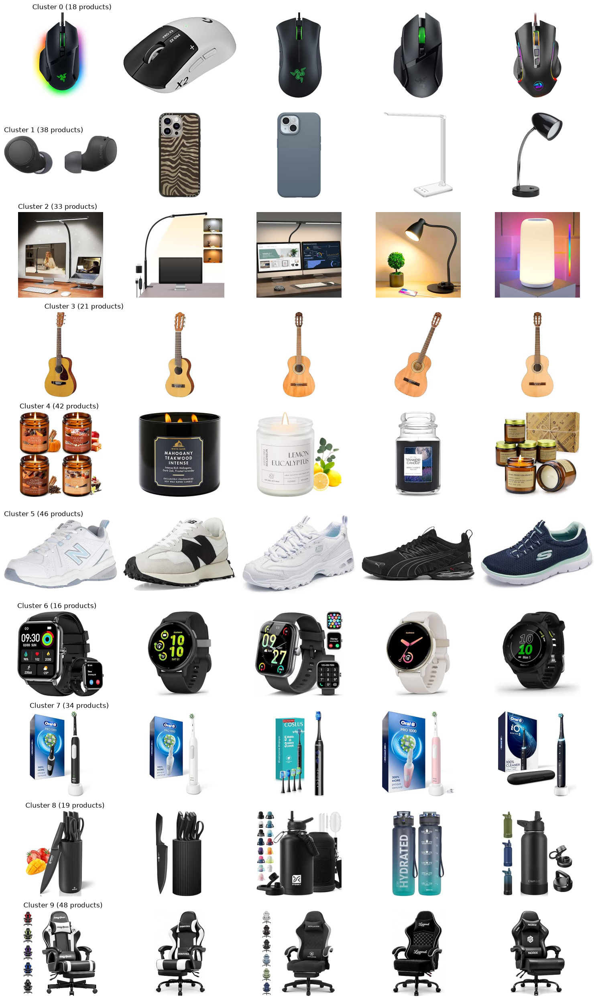

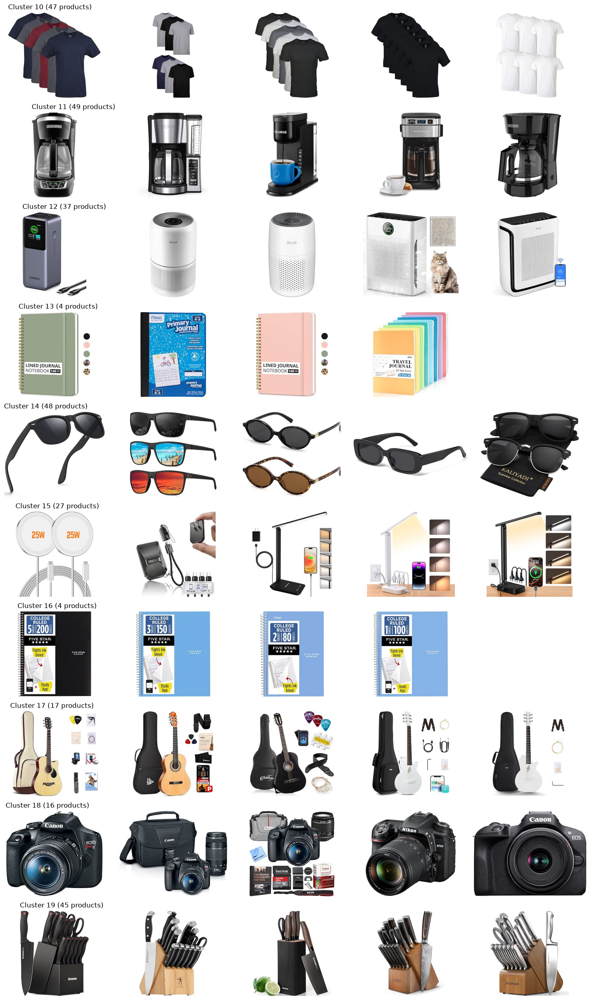

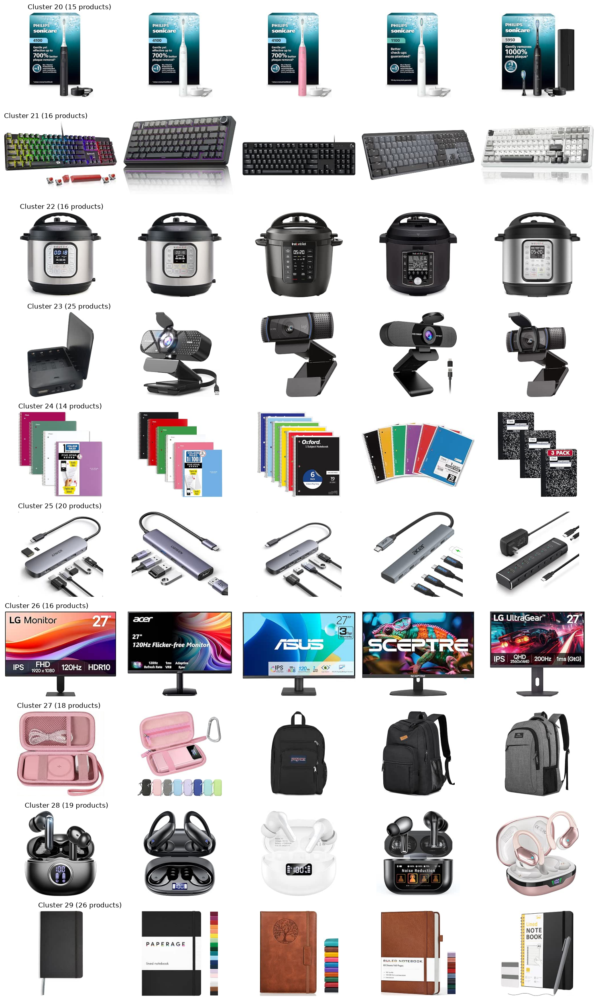

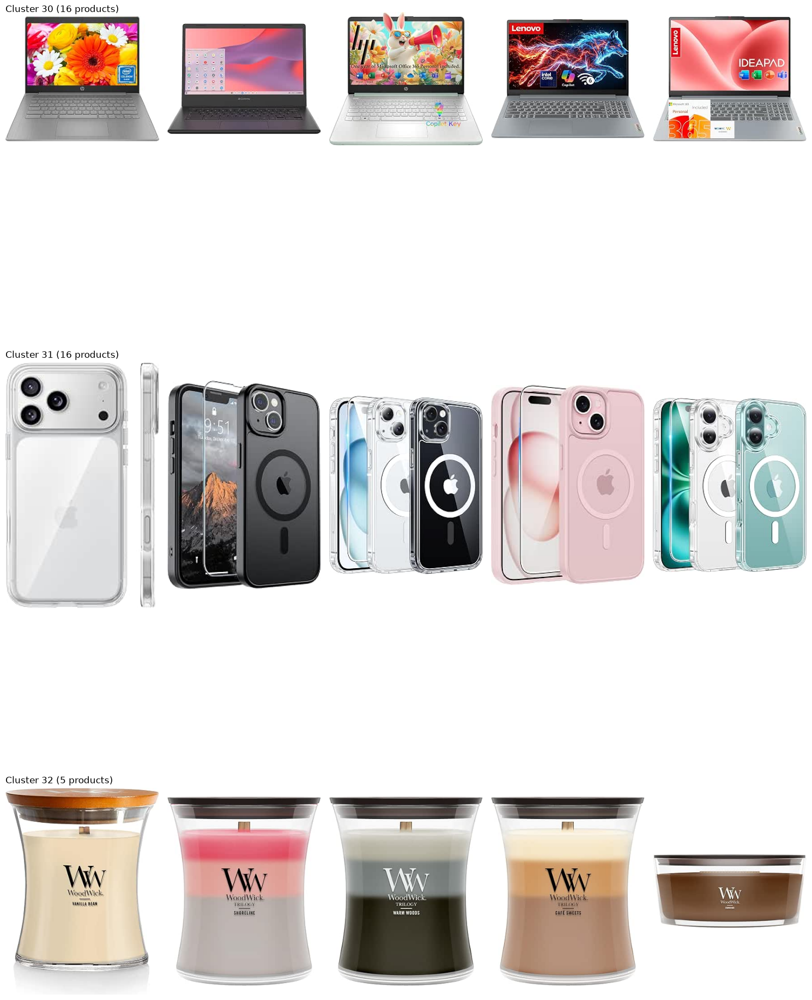

In [53]:
import matplotlib.pyplot as plt
from PIL import Image

# Number of sample images per cluster
samples_per_cluster = 5

for start_cluster in range(0, 33, 10):

    end_cluster = min(start_cluster + 10, 33)

    fig, axes = plt.subplots(
        end_cluster - start_cluster,
        samples_per_cluster,
        figsize=(15, 25)
    )

    for row, cluster_id in enumerate(
        range(start_cluster, end_cluster)
    ):

        cluster_images = image_df[
            image_df["cluster"] == cluster_id
        ].head(samples_per_cluster)

        for col in range(samples_per_cluster):

            ax = axes[row, col]

            if col < len(cluster_images):

                image_path = cluster_images.iloc[col]["image_path"]

                image = Image.open(
                    image_path
                ).convert("RGB")

                ax.imshow(image)

            ax.axis("off")

            if col == 0:
                ax.set_title(
                    f"Cluster {cluster_id} "
                    f"({len(image_df[image_df['cluster'] == cluster_id])} products)",
                    loc="left"
                )

    plt.tight_layout()
    plt.show()